In [1]:
# load the necessary module
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib
from sklearn.decomposition import PCA
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']

import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error

# first neural network with keras tutorial
from numpy import loadtxt
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

font = {'family' : 'sans-serif',
        'weight' : 'normal',
        'size'   : 40}

matplotlib.rc('font', **font)

In [2]:
# California snapshots
CA_ASO_files = [ 'CE20180423Data_set_SWE.csv', 'KC20190326_Data_set_SWE.csv', 'KN20190417_Data_set_SWE.csv', 
                'LB20190309_Data_set_SWE.csv', 'TE20190417_Data_set_SWE.csv', 'TB20180423_Data_set_SWE.csv', 
               'MB20190329_Data_set_SWE.csv', 'SF20180423_Data_set_SWE.csv', 'SJ20190325_Data_set_SWE.csv']
#Colorado Snapshots
COl_ASO_files = [ 'GE20180331_Data_set_SWE.csv', 'GE20190407_Data_set_SWE.csv', 'CB20160404_Data_set_SWE.csv',
                        'CM20190407_Data_set_SWE.csv', 'BR20190419_Data_set_SWE.csv', 'GT20190408_Data_set_SWE.csv',
                        'GT20180330_Data_set_SWE.csv']

# Factor analysis model for winter Snapshots in California and Colorado




# California With SWE

In [3]:
# creating the Dataframe and variable into X California
CA_dataframe = pd.read_csv(CA_ASO_files[0], index_col = 0)

for file in CA_ASO_files[1:]:
    dataframe = pd.read_csv(file, index_col = 0)
    CA_dataframe = pd.concat([CA_dataframe, dataframe], ignore_index=True)
    print(CA_dataframe.shape)

CA_dataset = CA_dataframe.values
CA_X = CA_dataset[:, 2:10]

# creating the Dataframe and variable into X COlarado
COL_dataframe = pd.read_csv(COl_ASO_files[0], index_col = 0)

for file in COl_ASO_files[1:]:
    dataframe = pd.read_csv(file, index_col = 0)
    COL_dataframe = pd.concat([COL_dataframe, dataframe], ignore_index=True)
    
COL_dataset = COL_dataframe.values
COL_X = COL_dataset[:, 2:10]




(2335, 10)
(3098, 10)
(3110, 10)
(5258, 10)
(6705, 10)
(7778, 10)
(8949, 10)
(10679, 10)


# Variance and Communality 

In [4]:
from factor_analyzer import FactorAnalyzer

# Perform factor analysis
fa_CA = FactorAnalyzer(n_factors = 2, rotation = 'varimax',method='ml')
fa_CA.fit(CA_X)
X_fa_CA = fa_CA.transform(CA_X)
print('Portion of variance explained by Factors: '+ str(np.mean(np.square(fa_CA.loadings_),axis = 0)))
print('Communality: '+str(np.sum(np.square(fa_CA.loadings_),axis = 1)))
var_f1 = np.mean(np.square(fa_CA.loadings_),axis = 0)[0]
var_f2 = np.mean(np.square(fa_CA.loadings_),axis = 0)[1]
#var_f3 = np.mean(np.square(fa_CA.loadings_),axis = 0)[2]
fa_CA.loadings_

Portion of variance explained by Factors: [0.51198763 0.173997  ]
Communality: [7.37167763e-02 2.35084608e-04 9.19410546e-01 9.38171700e-01
 9.47505959e-01 8.31028889e-01 9.95141341e-01 7.82666730e-01]


array([[-0.24638224, -0.11407265],
       [-0.0070359 ,  0.0136228 ],
       [ 0.94358501, -0.17046369],
       [-0.96731625, -0.04970893],
       [ 0.82714991,  0.51315591],
       [ 0.30978568,  0.85735741],
       [-0.99746645, -0.01421336],
       [ 0.65879471,  0.59047122]])

# Factor loading

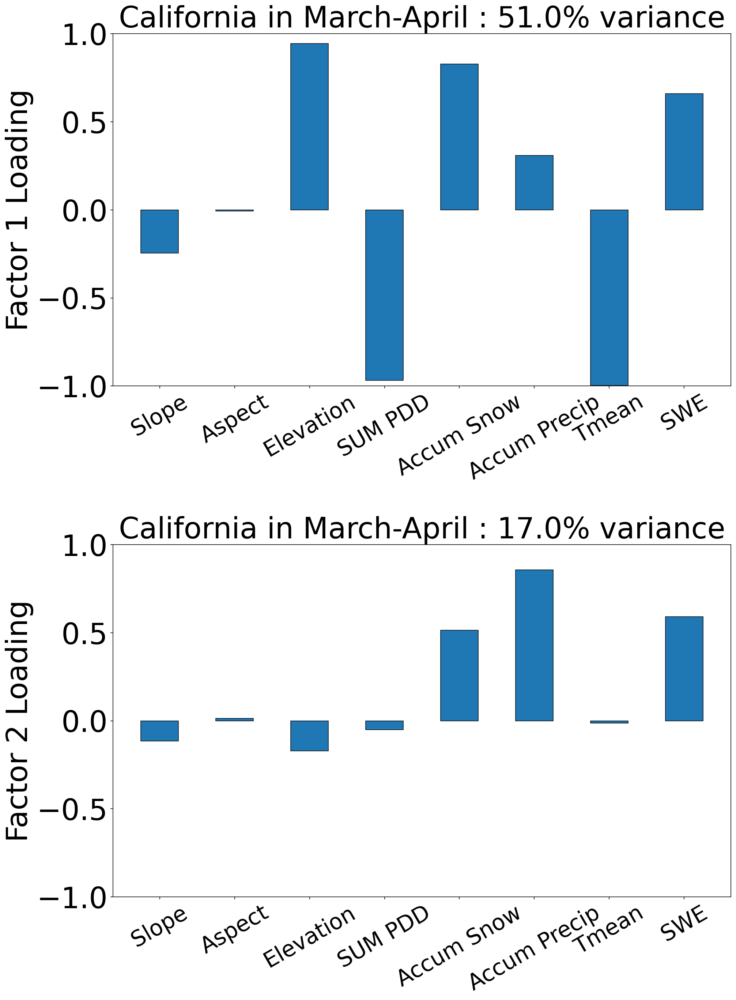

In [6]:
fig = plt.figure(figsize=(15,20))
plt.subplot(2,1,1)
bars = ['Slope', 'Aspect', 'Elevation',  'SUM PDD', 'Accum Snow', 'Accum Precip',  'Tmean', 'SWE']
plt.bar(range(len(bars)), fa_CA.loadings_.T[0], edgecolor='k', linewidth=0.75, width=0.5)
#plt.hlines(y=0, xmin=-2, xmax=2)
plt.ylim(-1, 1)
plt.xticks(range(len(bars)), bars, rotation=30, fontsize = 30)
plt.ylabel('Factor 1 Loading', fontsize = 40)
plt.title('California in March-April : ' + str(np.round((var_f1)*100))+'% variance', fontsize = 40)

plt.subplot(2,1,2)
plt.bar(range(len(bars)), fa_CA.loadings_.T[1], edgecolor='k', linewidth=0.75, width=0.5)
#plt.hlines(y=0, xmin=-2, xmax=2)
plt.ylim(-1, 1)
plt.xticks(range(len(bars)), bars, rotation=30, fontsize = 30)
plt.ylabel('Factor 2 Loading', fontsize = 40)
plt.title('California in March-April : ' + str(np.round((var_f2)*100))+'% variance', fontsize = 40)




fig.tight_layout()
fig.savefig('/scratch/users/lie08/FactorPlots_August_2023/CA_FA_laodingplot_winter_equal_y.pdf')


# Score plots

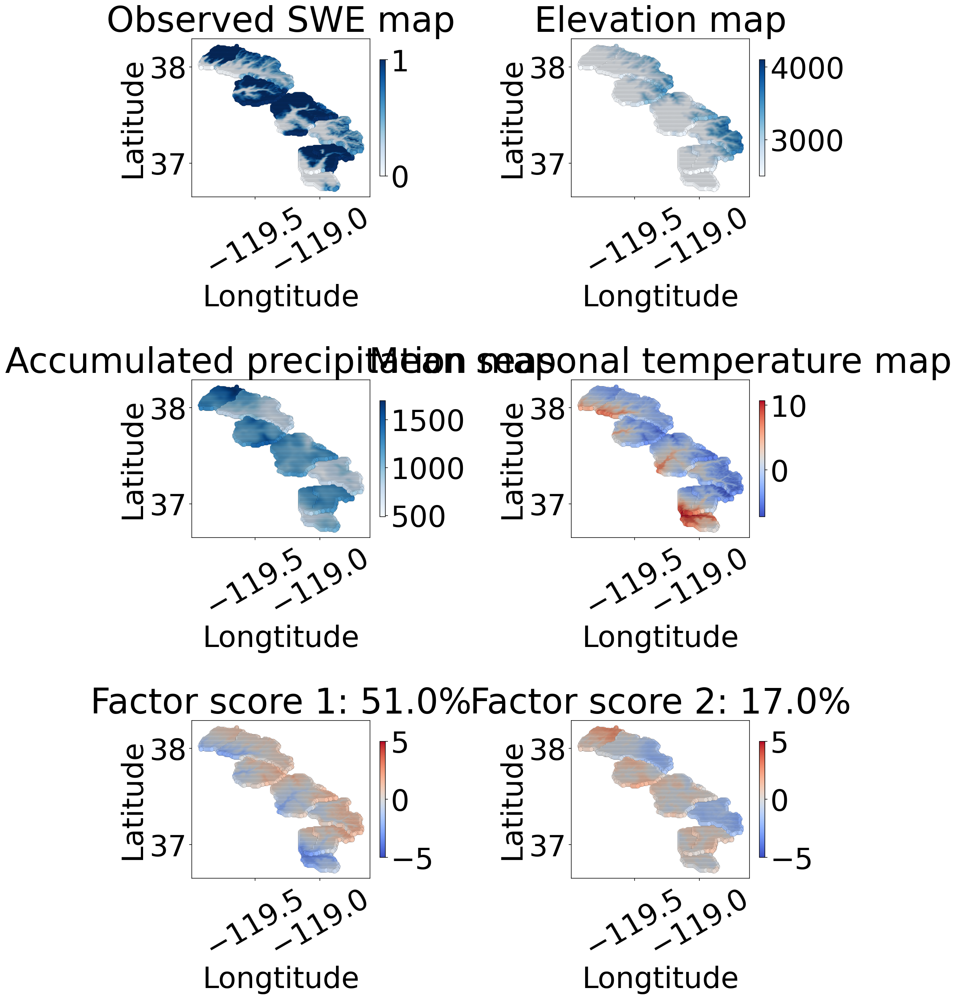

In [31]:
fig = plt.figure(figsize=(15,20))

ax = plt.subplot(3, 2, 1)
plt.scatter(CA_dataframe['Longitude'], CA_dataframe['Latitude'],
            c = CA_dataframe['SWE'], cmap = 'Blues',vmax=1, vmin=0,  edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Observed SWE map')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()

ax = plt.subplot(3, 2, 2)
plt.scatter(CA_dataframe['Longitude'], CA_dataframe['Latitude'],
            c = CA_dataframe['DEM'], cmap = 'Blues', vmin=2500, vmax=4100,  edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Elevation map')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()


ax = plt.subplot(3, 2, 3)
plt.scatter(CA_dataframe['Longitude'], CA_dataframe['Latitude'],
            c = CA_dataframe['Accumulate Precipitation'] , cmap = 'Blues', edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Accumulated precipitation map')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()

ax = plt.subplot(3, 2, 4)
plt.scatter(CA_dataframe['Longitude'], CA_dataframe['Latitude'],
            c = CA_dataframe['Average Temperature'] , cmap = 'coolwarm', edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Mean seasonal temperature map')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()


ax = plt.subplot(3, 2, 5)
plt.scatter(CA_dataframe['Longitude'], CA_dataframe['Latitude'],
            c = X_fa_CA[:,0], cmap = 'coolwarm', vmax=5, vmin=-5, edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Factor score 1: '+str(np.round(var_f1*100))+'%')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()

ax = plt.subplot(3, 2, 6)
plt.scatter(CA_dataframe['Longitude'], CA_dataframe['Latitude'],
            c = X_fa_CA[:,1], cmap = 'coolwarm', vmax=5, vmin=-5, edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Factor score 2: '+str(np.round(var_f2*100))+'%')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()

fig.savefig('/scratch/users/lie08/FA_results/CA_FA_scoreplot_winter.png')


# Error plots

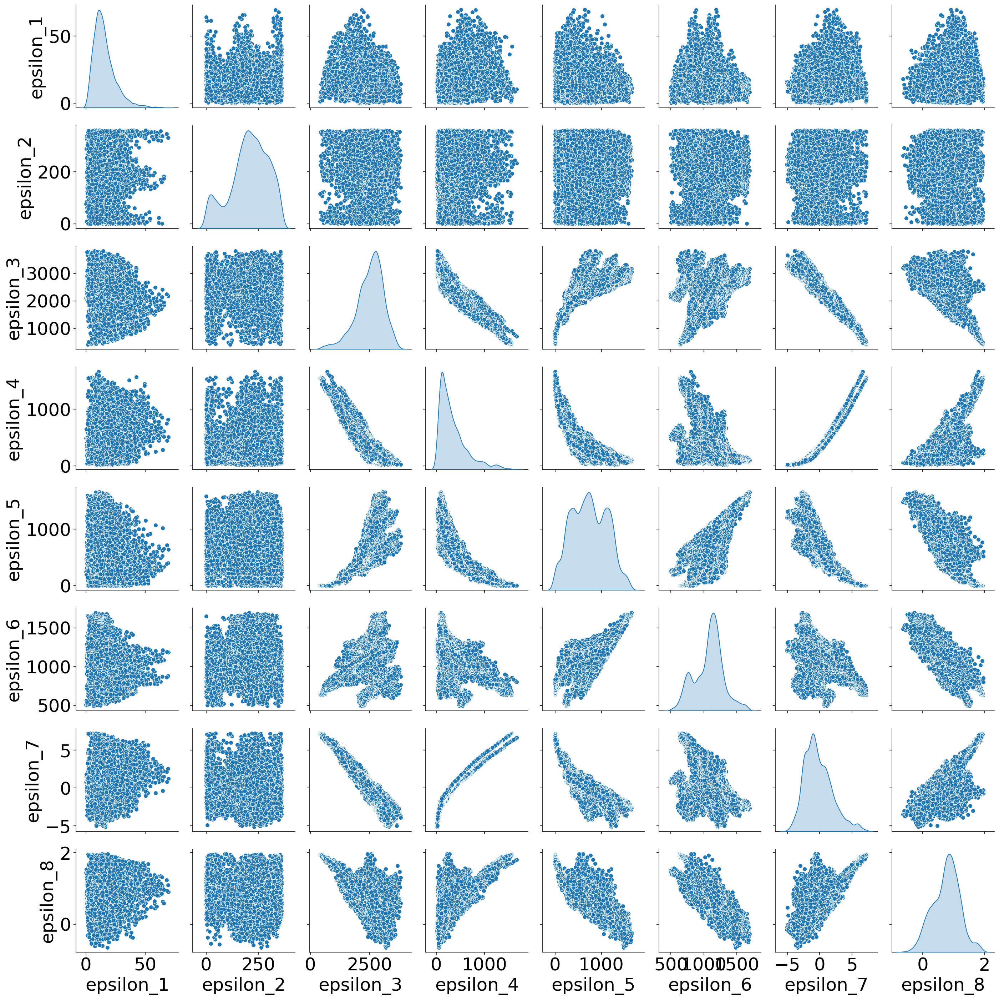

In [12]:
epsilon = CA_X-np.dot(X_fa_CA,fa_CA.loadings_.T)
sns.color_palette("Paired")
epsilon = pd.DataFrame(epsilon,columns = ['epsilon_1','epsilon_2','epsilon_3','epsilon_4', 'epsilon_5','epsilon_6','epsilon_7', 'epsilon_8'])
import seaborn as sns
sns_plot= sns.pairplot(epsilon, kind = 'scatter', diag_kind='kde')
sns_plot.figure.savefig('/scratch/users/lie08/FA_results/CA_FA_error_winter.png')

# Colorado Data With SWE

# Variance and Communality

In [9]:
from factor_analyzer import FactorAnalyzer

# Perform factor analysis
fa_COL = FactorAnalyzer(n_factors = 3, rotation = 'varimax',method='ml')
fa_COL.fit(COL_X)
X_fa_COL = fa_COL.transform(COL_X)
print('Portion of variance explained by Factors: '+ str(np.mean(np.square(fa_COL.loadings_),axis = 0)))
print('Communality: '+str(np.sum(np.square(fa_COL.loadings_),axis = 1)))
var_f1 = np.mean(np.square(fa_COL.loadings_),axis = 0)[0]
var_f2 = np.mean(np.square(fa_COL.loadings_),axis = 0)[1]
var_f3 = np.mean(np.square(fa_COL.loadings_),axis = 0)[2]
fa_COL.loadings_

Portion of variance explained by Factors: [0.39962776 0.12282857 0.11629053]
Communality: [0.20869017 0.0213904  0.99500199 0.14894985 0.99544821 0.99526208
 0.99500752 0.75022459]


array([[ 0.28390943,  0.31862256,  0.16298857],
       [-0.01576938,  0.06119067, -0.13189932],
       [ 0.40002928,  0.81473813, -0.41373946],
       [ 0.01047034, -0.37883832,  0.07295032],
       [ 0.98384028,  0.09443356, -0.13634083],
       [ 0.99463126,  0.07369558, -0.02323149],
       [-0.56756014,  0.05823072,  0.81822502],
       [ 0.82260454,  0.22870866, -0.14573509]])

# Factor Loading 

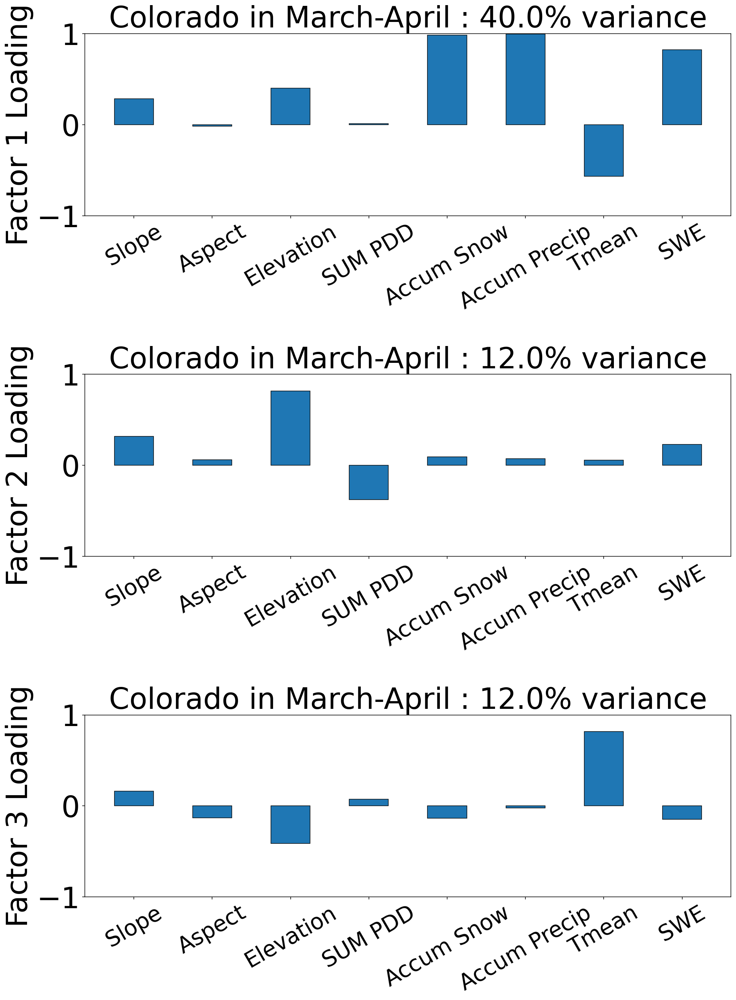

In [10]:
fig = plt.figure(figsize=(15,20))
plt.subplot(3,1,1)
bars = ['Slope', 'Aspect', 'Elevation',  'SUM PDD', 'Accum Snow', 'Accum Precip',  'Tmean', 'SWE']
plt.bar(range(len(bars)), fa_COL.loadings_.T[0], edgecolor='k', linewidth=0.75, width=0.5)
#plt.hlines(y=0, xmin=-2, xmax=2)
plt.ylim(-1, 1)
plt.xticks(range(len(bars)), bars, rotation=30, fontsize = 30)
plt.ylabel('Factor 1 Loading', fontsize = 40)
plt.title('Colorado in March-April : ' + str(np.round((var_f1)*100))+'% variance', fontsize = 40)

plt.subplot(3,1,2)
plt.bar(range(len(bars)), fa_COL.loadings_.T[1], edgecolor='k', linewidth=0.75, width=0.5)
#plt.hlines(y=0, xmin=-2, xmax=2)
plt.ylim(-1, 1)
plt.xticks(range(len(bars)), bars, rotation=30, fontsize = 30)
plt.ylabel('Factor 2 Loading', fontsize = 40)
plt.title('Colorado in March-April : ' + str(np.round((var_f2)*100))+'% variance', fontsize = 40)

plt.subplot(3,1,3)
plt.bar(range(len(bars)), fa_COL.loadings_.T[2], edgecolor='k', linewidth=0.75, width=0.5)
#plt.hlines(y=0, xmin=-2, xmax=2)
plt.ylim(-1, 1)
plt.xticks(range(len(bars)), bars, rotation=30, fontsize = 30)
plt.ylabel('Factor 3 Loading', fontsize = 40)
plt.title('Colorado in March-April : ' + str(np.round((var_f3)*100))+'% variance', fontsize = 40)

fig.tight_layout()
fig.savefig('/scratch/users/lie08/FactorPlots_August_2023/COL_FA_laodingplot_winter_equal_y.pdf')



# Score Plots

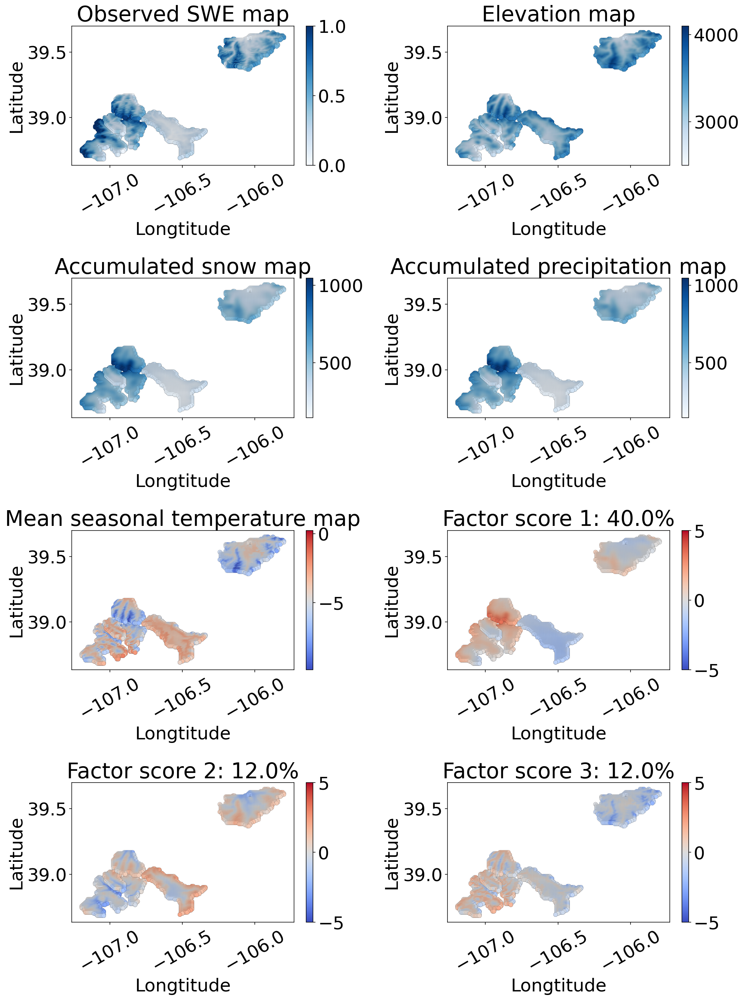

In [7]:
fig = plt.figure(figsize=(15,20))

ax = plt.subplot(4, 2, 1)
plt.scatter(COL_dataframe['Longitude'], COL_dataframe['Latitude'],
            c = COL_dataframe['SWE'], cmap = 'Blues',vmax=1, vmin=0,  edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Observed SWE map')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()

ax = plt.subplot(4, 2, 2)
plt.scatter(COL_dataframe['Longitude'], COL_dataframe['Latitude'],
            c = COL_dataframe['DEM'], cmap = 'Blues', vmin=2500, vmax=4100,  edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Elevation map')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()


ax = plt.subplot(4, 2, 3)
plt.scatter(COL_dataframe['Longitude'], COL_dataframe['Latitude'],
            c = COL_dataframe['Accumulate Precipitation'] , cmap = 'Blues', edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Accumulated snow map')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()


ax = plt.subplot(4, 2, 4)
plt.scatter(COL_dataframe['Longitude'], COL_dataframe['Latitude'],
            c = COL_dataframe['Accumulate Precipitation'] , cmap = 'Blues', edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Accumulated precipitation map')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()

ax = plt.subplot(4, 2, 5)
plt.scatter(COL_dataframe['Longitude'], COL_dataframe['Latitude'],
            c = COL_dataframe['Average Temperature'] , cmap = 'coolwarm', edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Mean seasonal temperature map')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()


ax = plt.subplot(4, 2, 6)
plt.scatter(COL_dataframe['Longitude'], COL_dataframe['Latitude'],
            c = X_fa_COL[:,0], cmap = 'coolwarm', vmax=5, vmin=-5, edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Factor score 1: '+str(np.round(var_f1*100))+'%')

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)
plt.tight_layout()

ax = plt.subplot(4, 2, 7)
plt.scatter(COL_dataframe['Longitude'], COL_dataframe['Latitude'],
            c = X_fa_COL[:,1], cmap = 'coolwarm', vmax=5, vmin=-5, edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Factor score 2: '+str(np.round(var_f2*100))+'%' )

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)

ax = plt.subplot(4, 2, 8)
plt.scatter(COL_dataframe['Longitude'], COL_dataframe['Latitude'],
            c = X_fa_COL[:,2], cmap = 'coolwarm', vmax=5, vmin=-5, edgecolor='k', linewidth=0.1)
plt.colorbar(fraction=0.03)
plt.title('Factor score 3: '+str(np.round(var_f2*100))+'%' )

plt.xlabel('Longtitude')
plt.ylabel('Latitude')
locs, labels = plt.xticks()
# (sub)plot - set values
plt.setp(labels, rotation=30)

plt.tight_layout()
fig.savefig('/scratch/users/lie08/FA_results/COL_FA_scoreplot_winter.png')


# Error plots

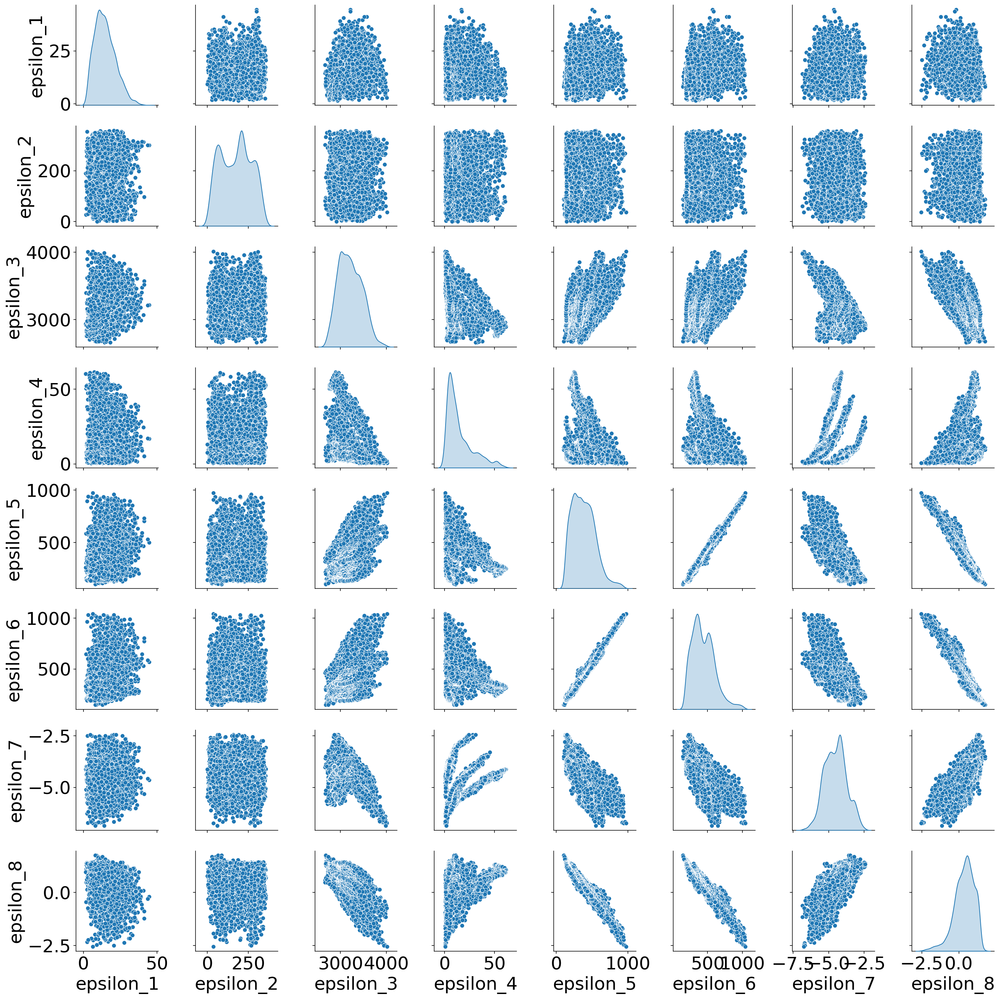

In [8]:
import seaborn as sns
epsilon = COL_X-np.dot(X_fa_COL,fa_COL.loadings_.T)
epsilon = pd.DataFrame(epsilon,columns = ['epsilon_1','epsilon_2','epsilon_3','epsilon_4', 'epsilon_5','epsilon_6','epsilon_7', 'epsilon_8'])
sns_plot = sns.pairplot(epsilon, kind = 'scatter', diag_kind='kde')
sns_plot.figure.savefig('/scratch/users/lie08/FA_results/COL_FA_error_winter.png')